In [1]:
import itertools
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import pandas as pd
import math

from sklearn import metrics
from random import randint
from matplotlib import style

from sklearn.cluster import DBSCAN
from sklearn.preprocessing import MinMaxScaler

import seaborn as sns
plt.rc('figure', figsize=(13, 7))
plt.style.use('seaborn-whitegrid')
plt.rc('font', size=16)
#plt.style.use('fivethirtyeight')

In [2]:
def get_curriculum_logs():
    
    # imports
    import os
    import env
    import pandas as pd

    filename = "curriculum_logs.csv"

    if os.path.isfile(filename):
        return pd.read_csv(filename, index_col=False)
    else:
        # Get datafream from SQL query 
        URL = f'mysql+pymysql://{env.user}:{env.password}@{env.host}/curriculum_logs'
        SQL = '''
        SELECT *
        FROM logs
        LEFT JOIN cohorts on cohorts.id = logs.cohort_id;
        '''
        curriculum_logs = pd.read_sql(SQL, URL)
        
        # Create csv of the sql
        curriculum_logs.to_csv('curriculum_logs.csv')

        return curriculum_logs 

In [3]:
df = get_curriculum_logs()
df.head()

,Unnamed: 0,date,time,path,user_id,cohort_id,ip,id,name,slack,start_date,end_date,created_at,updated_at,deleted_at,program_id
0,0,2018-01-26,09:55:03,/,1,8.0,97.105.19.61,8.0,Hampton,#hampton,2015-09-22,2016-02-06,2016-06-14 19:52:26,2016-06-14 19:52:26,NaN,1.0
1,1,2018-01-26,09:56:02,java-ii,1,8.0,97.105.19.61,8.0,Hampton,#hampton,2015-09-22,2016-02-06,2016-06-14 19:52:26,2016-06-14 19:52:26,NaN,1.0
2,2,2018-01-26,09:56:05,java-ii/object-oriented-programming,1,8.0,97.105.19.61,8.0,Hampton,#hampton,2015-09-22,2016-02-06,2016-06-14 19:52:26,2016-06-14 19:52:26,NaN,1.0
3,3,2018-01-26,09:56:06,slides/object_oriented_programming,1,8.0,97.105.19.61,8.0,Hampton,#hampton,2015-09-22,2016-02-06,2016-06-14 19:52:26,2016-06-14 19:52:26,NaN,1.0
4,4,2018-01-26,09:56:24,javascript-i/conditionals,2,22.0,97.105.19.61,22.0,Teddy,#teddy,2018-01-08,2018-05-17,2018-01-08 13:59:10,2018-01-08 13:59:10,NaN,2.0


In [4]:
#df = pd.read_csv('curriculum_logs.csv')

# concatenate and change date type columns to the respective type 
df['date_time'] = df.date + ' ' + df.time
df.date_time = pd.to_datetime(df.date_time, format = '%Y-%m-%d %H:%M:%S')
df.date = pd.to_datetime(df.date)
df.time = pd.to_datetime(df.time).dt.time
df.start_date = pd.to_datetime(df.start_date)
df.end_date = pd.to_datetime(df.end_date)
df.created_at = pd.to_datetime(df.created_at)
df.deleted_at = pd.to_datetime(df.deleted_at)

# missing entirety of columns
df.drop(['Unnamed: 0', 'id', 'slack','deleted_at'], inplace = True, axis = 1)

# let's clean up the dataset
df.dropna(inplace = True)

# set the index
df = df.set_index(df.date)

# let's rename some columns
df.rename(columns = {'path':'endpoint', 'ip':'source_ip', 'name':'cohort_name'}, inplace = True)

# add program name to dataframe
df['program_name'] = df.program_id.map({1.0: 'PHP Full Stack Web Development',
                                        2.0: 'Java Full Stack Web Development',
                                        3.0: 'Data Science',
                                        4.0: 'Front End Web Development'})

df.head()

,date,time,endpoint,user_id,cohort_id,source_ip,cohort_name,start_date,end_date,created_at,updated_at,program_id,date_time,program_name
date,,,,,,,,,,,,,,
2018-01-26,2018-01-26,09:55:03,/,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,2016-06-14 19:52:26,2016-06-14 19:52:26,1.0,2018-01-26 09:55:03,PHP Full Stack Web Development
2018-01-26,2018-01-26,09:56:02,java-ii,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,2016-06-14 19:52:26,2016-06-14 19:52:26,1.0,2018-01-26 09:56:02,PHP Full Stack Web Development
2018-01-26,2018-01-26,09:56:05,java-ii/object-oriented-programming,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,2016-06-14 19:52:26,2016-06-14 19:52:26,1.0,2018-01-26 09:56:05,PHP Full Stack Web Development
2018-01-26,2018-01-26,09:56:06,slides/object_oriented_programming,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,2016-06-14 19:52:26,2016-06-14 19:52:26,1.0,2018-01-26 09:56:06,PHP Full Stack Web Development
2018-01-26,2018-01-26,09:56:24,javascript-i/conditionals,2,22.0,97.105.19.61,Teddy,2018-01-08,2018-05-17,2018-01-08 13:59:10,2018-01-08 13:59:10,2.0,2018-01-26 09:56:24,Java Full Stack Web Development


In [5]:
print(df.shape)
print(f'___________________________')
print(df.info())
print(f'___________________________')      
print(df.isnull().sum())


(847329, 14)
___________________________
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 847329 entries, 2018-01-26 to 2021-04-21
Data columns (total 14 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   date          847329 non-null  datetime64[ns]
 1   time          847329 non-null  object        
 2   endpoint      847329 non-null  object        
 3   user_id       847329 non-null  int64         
 4   cohort_id     847329 non-null  float64       
 5   source_ip     847329 non-null  object        
 6   cohort_name   847329 non-null  object        
 7   start_date    847329 non-null  datetime64[ns]
 8   end_date      847329 non-null  datetime64[ns]
 9   created_at    847329 non-null  datetime64[ns]
 10  updated_at    847329 non-null  object        
 11  program_id    847329 non-null  float64       
 12  date_time     847329 non-null  datetime64[ns]
 13  program_name  847329 non-null  object        
dtypes: datetime

# 1. 
Which lesson appears to attract the most traffic consistently across cohorts (per program)?

In [6]:
cohort_program = pd.DataFrame(columns = ['cohort','program_name'])
for cohort in df.cohort_name.unique():
    for program in df[df['cohort_name'] == cohort].program_name.unique():
        cohort_program = cohort_program.append({'cohort':cohort, 'program_name':program}, ignore_index = True)
cohort_program.T

,0,1,2,3,4,5,6,7,8,9,...,37,38,39,40,41,42,43,44,45,46
cohort,Hampton,Teddy,Sequoia,Arches,Niagara,Pinnacles,Quincy,Kings,Lassen,Mammoth,...,Darden,Bash,Jupiter,Kalypso,Luna,Easley,Marco,Neptune,Florence,Oberon
program_name,PHP Full Stack Web Development,Java Full Stack Web Development,Java Full Stack Web Development,PHP Full Stack Web Development,Java Full Stack Web Development,Java Full Stack Web Development,PHP Full Stack Web Development,PHP Full Stack Web Development,PHP Full Stack Web Development,Java Full Stack Web Development,...,Data Science,Java Full Stack Web Development,Java Full Stack Web Development,Java Full Stack Web Development,Java Full Stack Web Development,Data Science,Java Full Stack Web Development,Java Full Stack Web Development,Data Science,Java Full Stack Web Development


In [7]:
df_dw = df.copy()

In [8]:
df_dw.head()

,date,time,endpoint,user_id,cohort_id,source_ip,cohort_name,start_date,end_date,created_at,updated_at,program_id,date_time,program_name
date,,,,,,,,,,,,,,
2018-01-26,2018-01-26,09:55:03,/,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,2016-06-14 19:52:26,2016-06-14 19:52:26,1.0,2018-01-26 09:55:03,PHP Full Stack Web Development
2018-01-26,2018-01-26,09:56:02,java-ii,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,2016-06-14 19:52:26,2016-06-14 19:52:26,1.0,2018-01-26 09:56:02,PHP Full Stack Web Development
2018-01-26,2018-01-26,09:56:05,java-ii/object-oriented-programming,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,2016-06-14 19:52:26,2016-06-14 19:52:26,1.0,2018-01-26 09:56:05,PHP Full Stack Web Development
2018-01-26,2018-01-26,09:56:06,slides/object_oriented_programming,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,2016-06-14 19:52:26,2016-06-14 19:52:26,1.0,2018-01-26 09:56:06,PHP Full Stack Web Development
2018-01-26,2018-01-26,09:56:24,javascript-i/conditionals,2,22.0,97.105.19.61,Teddy,2018-01-08,2018-05-17,2018-01-08 13:59:10,2018-01-08 13:59:10,2.0,2018-01-26 09:56:24,Java Full Stack Web Development


In [9]:
df_dw.endpoint.value_counts()

/                                        45854
javascript-i                             18203
toc                                      17591
search/search_index.json                 17534
java-iii                                 13166
                                         ...  
%20https://github.com/RaulCPena              1
slides/exceptions_and_error_handlings        1
bayes-capstones                              1
spring/services                              1
appendix/professional                        1
Name: endpoint, Length: 2224, dtype: int64

In [10]:
# after going through the contents of the endpoint feature, the following words were 
# and need to be removed as these are only elements of the web page or the introductory page
dropped_words = ['/', '.jpg', '.json', '.gif', '.png', '.jpeg', '.svg']

In [11]:
# let's remove the words in the dropped_words list
for word in dropped_words:
    df_dw = df_dw[~df_dw['endpoint'].str.endswith(word)]

In [12]:
df_dw.endpoint.value_counts()

javascript-i                                      18203
toc                                               17591
java-iii                                          13166
html-css                                          13127
java-ii                                           12177
                                                  ...  
%20https://github.com/RaulCPena                       1
Correlation.md                                        1
spring/services                                       1
10.00_Intro                                           1
5-stats/2.1-probability_and_event_interactions        1
Name: endpoint, Length: 2147, dtype: int64

In [13]:
df_dw.shape

(762137, 14)

In [14]:
df_dw.program_name.unique()

array(['PHP Full Stack Web Development',
       'Java Full Stack Web Development', 'Front End Web Development',
       'Data Science'], dtype=object)

''

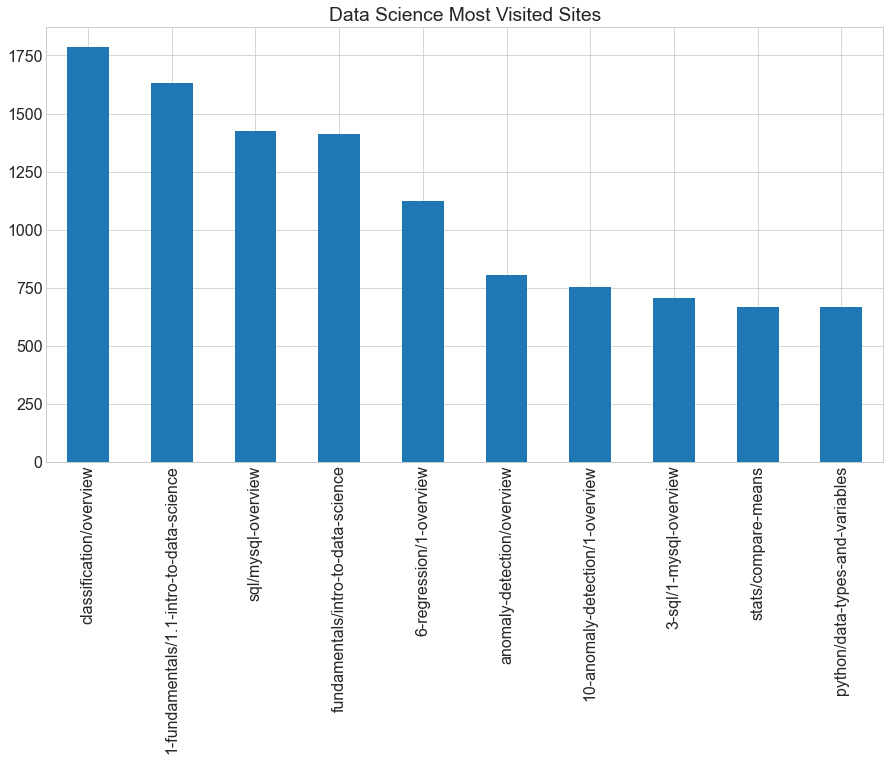

In [15]:
df_dw[df_dw['program_name'] == 'Data Science'].endpoint.value_counts().head(10).plot.bar(title = 'Data Science Most Visited Sites', figsize = (15,8))
;

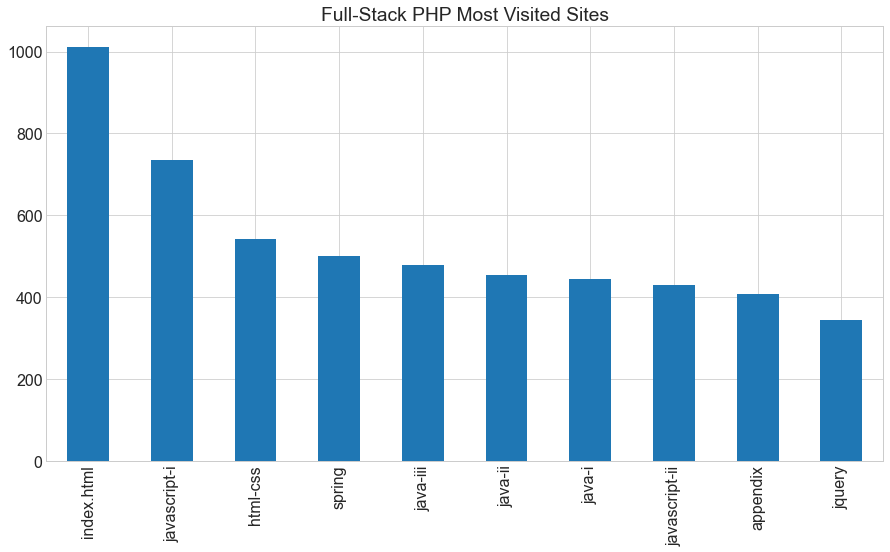

In [16]:
df_dw[df_dw['program_name'] == 'PHP Full Stack Web Development'].endpoint.value_counts().head(10).plot.bar(title = 'Full-Stack PHP Most Visited Sites', figsize = (15,8));

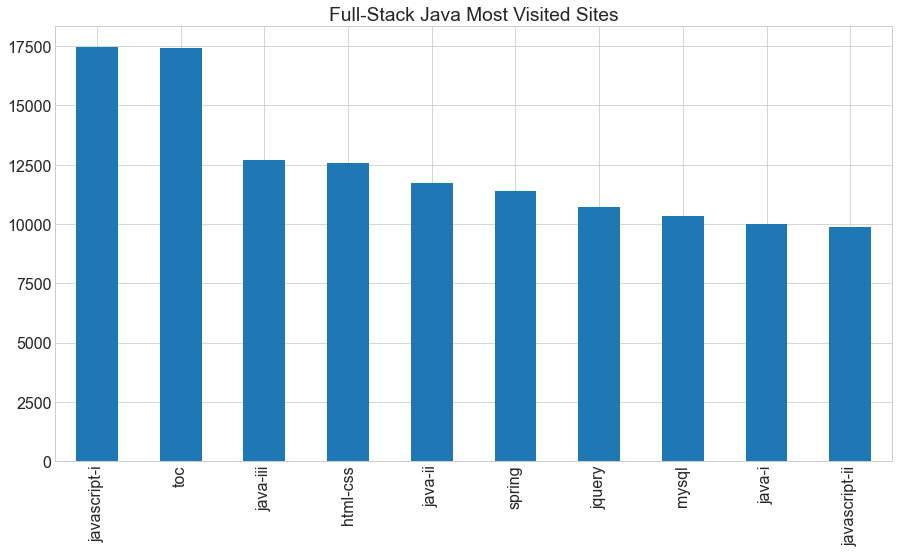

In [17]:
df_dw[df_dw['program_name'] == 'Java Full Stack Web Development'].endpoint.value_counts().head(10).plot.bar(title = 'Full-Stack Java Most Visited Sites', figsize = (15,8));

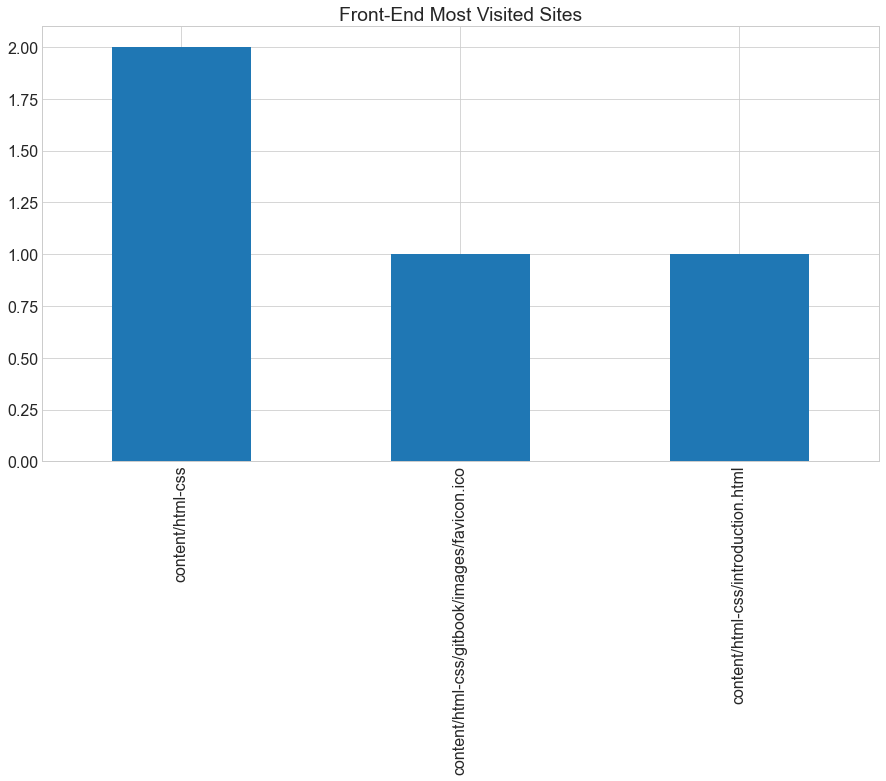

In [18]:
df_dw[df_dw['program_name'] == 'Front End Web Development'].endpoint.value_counts().head(10).plot.bar(title = 'Front-End Most Visited Sites', figsize = (15,8));

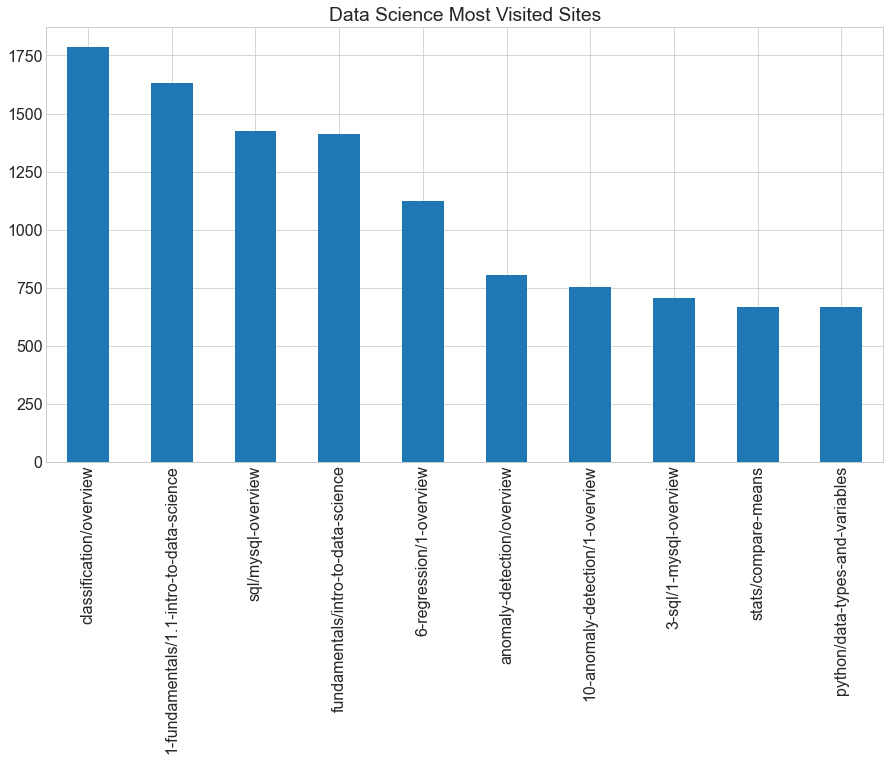

In [19]:
df_dw[df_dw['program_name'] == 'Data Science'].endpoint.value_counts().head(10).plot.bar(title = 'Data Science Most Visited Sites', figsize = (15,8));

# 2.
Is there a cohort that referred to a lesson significantly more than other cohorts seemed to gloss over?

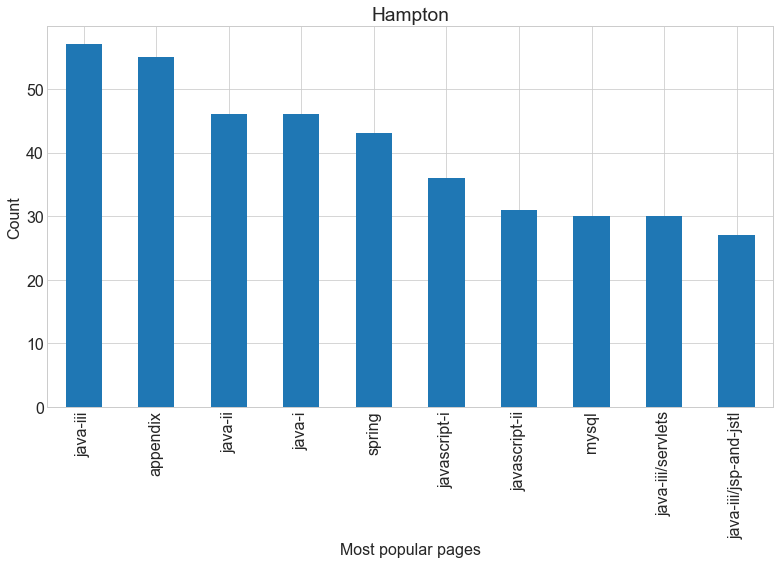

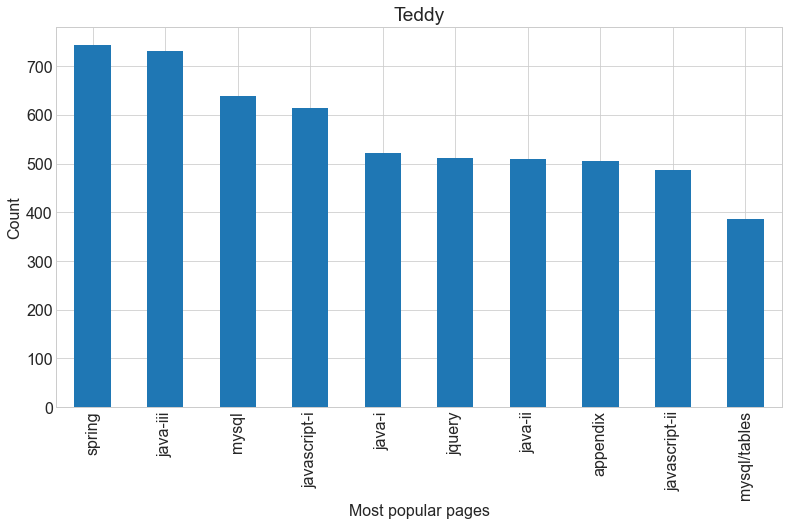

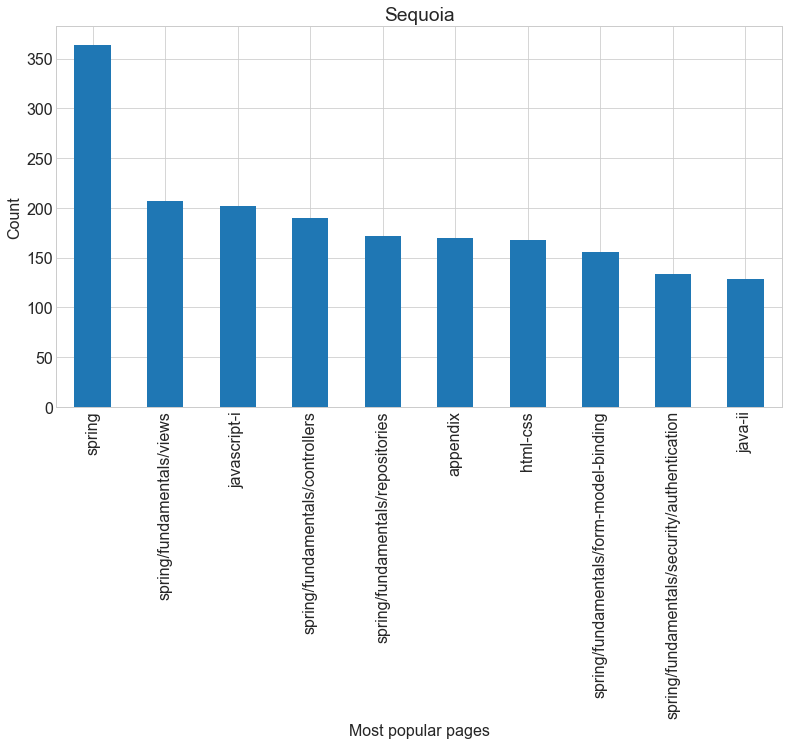

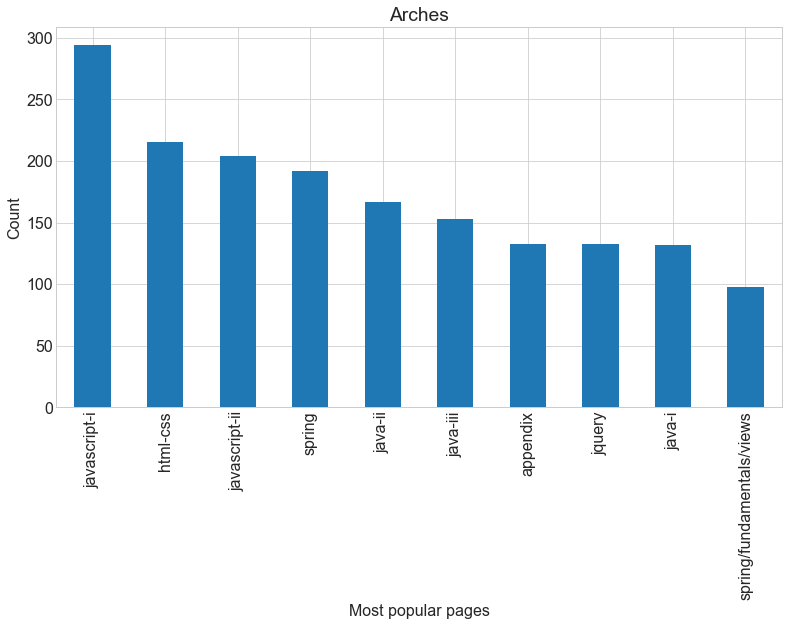

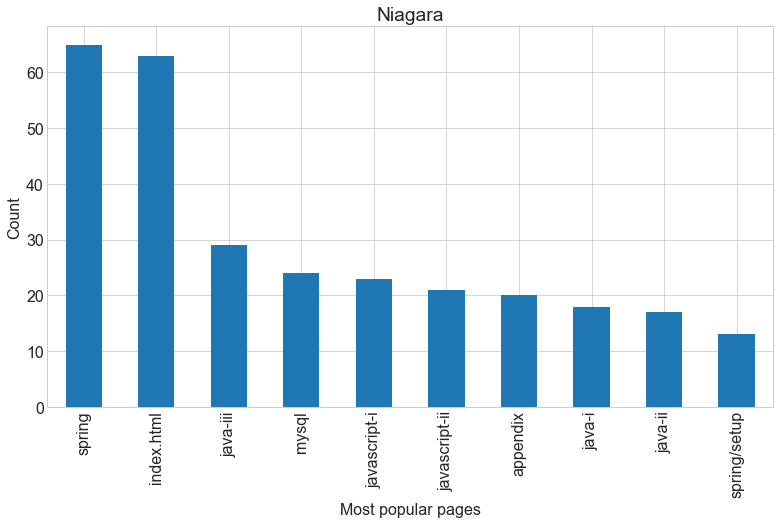

...

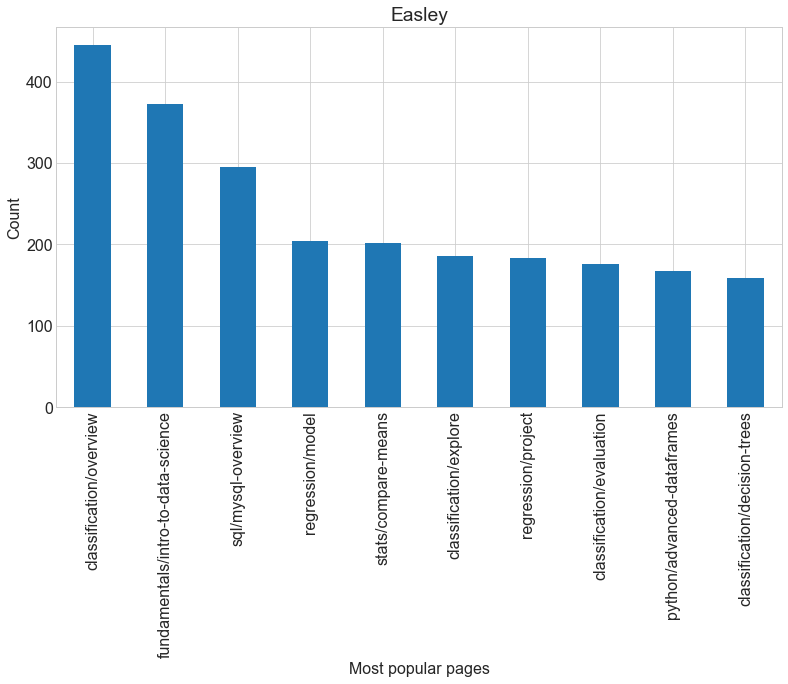

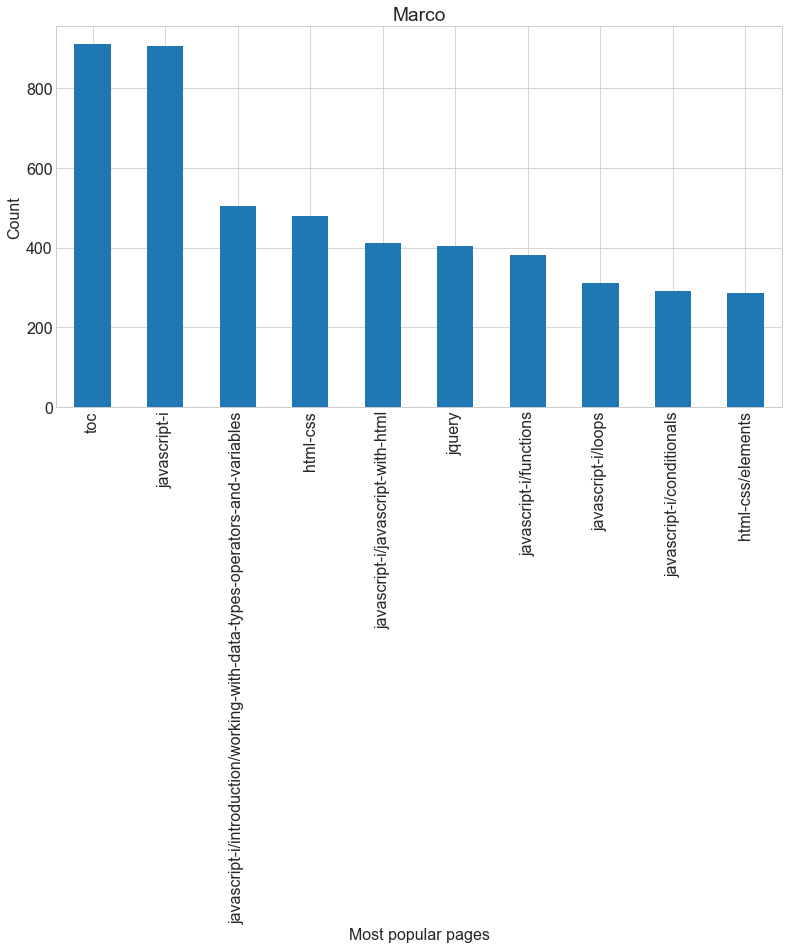

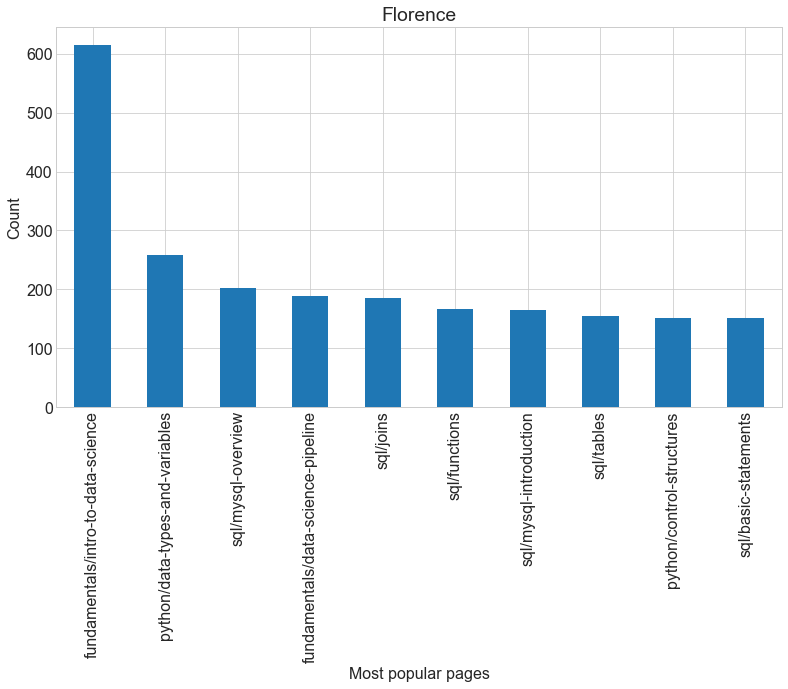

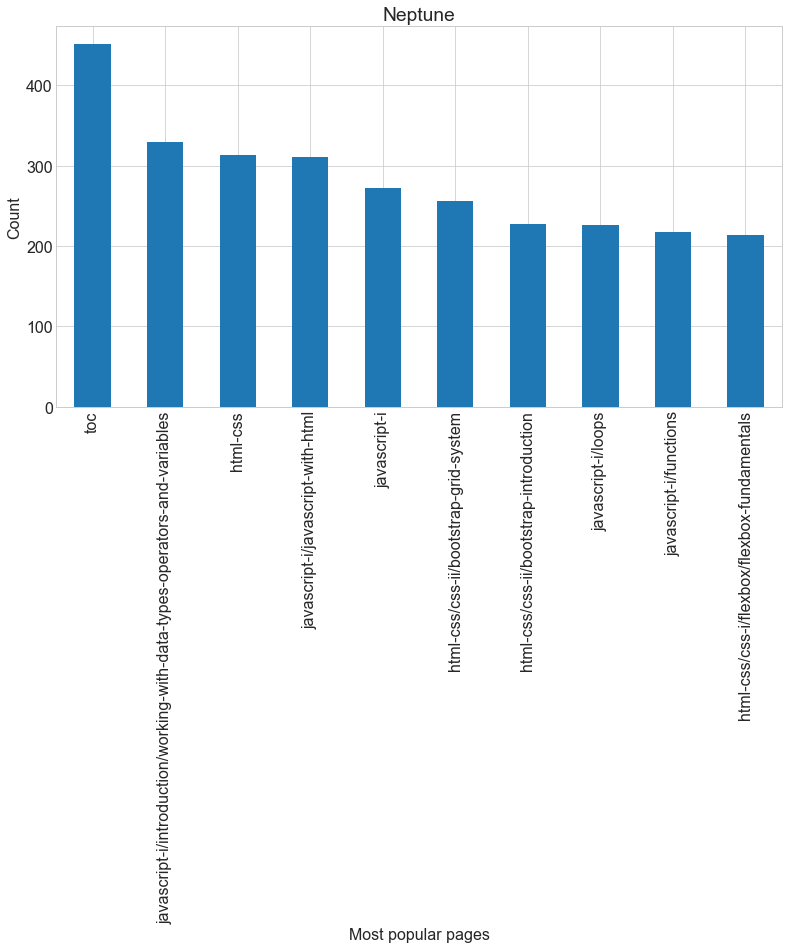

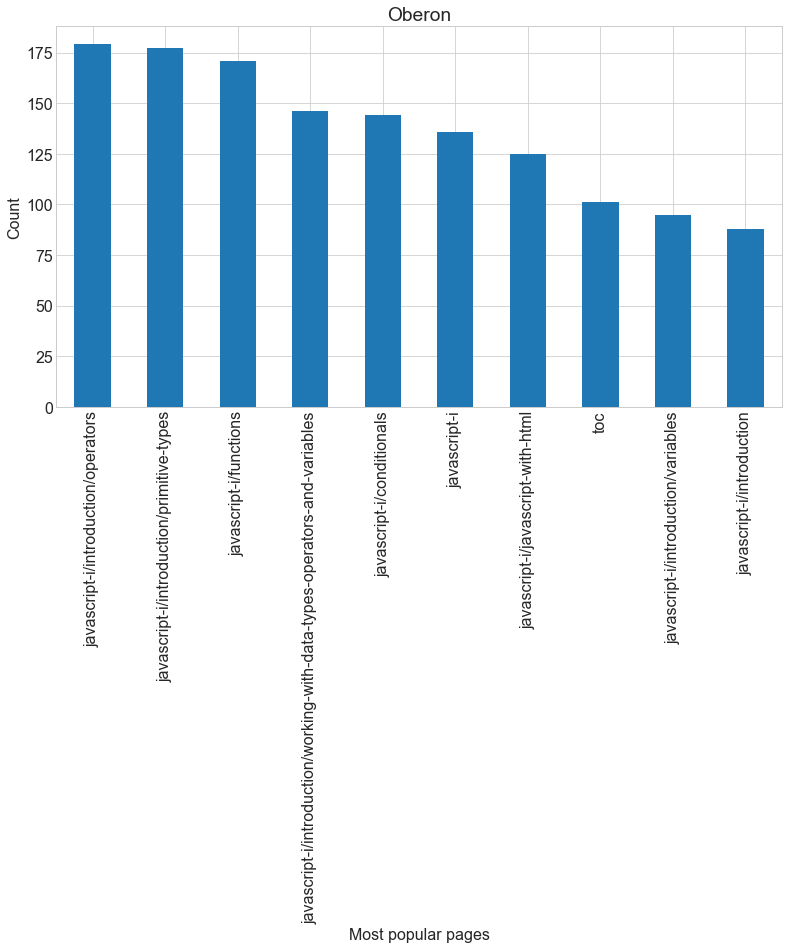

In [20]:
for program in df_dw.program_name.unique():
    plt.title(program)
    for cohort in df_dw.cohort_name.unique():
        plt.title(cohort)
        df_dw[df_dw['cohort_name'] == cohort].endpoint.value_counts().head(10).plot.bar()
        plt.xlabel('Most popular pages')
        plt.ylabel('Count')
        plt.show();


In [21]:
df_dw[df_dw['cohort_name'] == 'Teddy'].endpoint.value_counts().head(10)

spring           744
java-iii         732
mysql            638
javascript-i     615
java-i           522
jquery           512
java-ii          509
appendix         505
javascript-ii    487
mysql/tables     387
Name: endpoint, dtype: int64

In [22]:
df_dw.groupby('endpoint').cohort_name.value_counts().to_frame()

cohort_name
endpoint                         cohort_name             
%20https://github.com/RaulCPena  Curie                  1
'                                Staff                  1
,%20https://github.com/RaulCPena Curie                  1
.git                             Voyageurs              1
.gitignore                       Darden                 1
...                                                   ...
where                            Florence               1
working-with-time-series-data    Darden                14
                                 Staff                  1
wp-admin                         Teddy                  1
wp-login                         Teddy                  1

[13138 rows x 1 columns]

In [23]:
df_dw.groupby(df_dw['cohort_name']).cohort_name.value_counts().to_frame()

,,cohort_name
cohort_name,cohort_name,
Andromeda,Andromeda,23795
Apex,Apex,30672
Apollo,Apollo,4
Arches,Arches,8146
Badlands,Badlands,76
Bash,Bash,16238
Bayes,Bayes,21331
Betelgeuse,Betelgeuse,27560
Ceres,Ceres,37607


In [24]:
df_dw[df_dw['cohort_name'] == 'Darden'].endpoint.value_counts().head(10).to_frame().reset_index()

,index,endpoint
0,classification/overview,1109
1,sql/mysql-overview,774
2,anomaly-detection/overview,592
3,1-fundamentals/1.1-intro-to-data-science,460
4,classification/logistic-regression,423
5,stats/compare-means,423
6,classification/prep,367
7,classification/explore,352
8,classification/evaluation,336
9,fundamentals/intro-to-data-science,305


In [25]:
df_dw.endpoint.unique()

array(['java-ii', 'java-ii/object-oriented-programming',
       'slides/object_oriented_programming', ...,
       'florence-python-assessment.html', 'javascript-i/dom',
       'appendix/professional-development/post-interview-review-form'],
      dtype=object)

In [26]:
for index in df_dw[df_dw['cohort_name'] == 'Europa'].endpoint.value_counts().head(10).to_frame().reset_index():
    print(index)
    

index
endpoint


# 3.
Are there students who, when active, hardly access the curriculum? If so, what information do you have about these students?

In [27]:
df_dw

,date,time,endpoint,user_id,cohort_id,source_ip,cohort_name,start_date,end_date,created_at,updated_at,program_id,date_time,program_name
date,,,,,,,,,,,,,,
2018-01-26,2018-01-26,09:56:02,java-ii,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,2016-06-14 19:52:26,2016-06-14 19:52:26,1.0,2018-01-26 09:56:02,PHP Full Stack Web Development
2018-01-26,2018-01-26,09:56:05,java-ii/object-oriented-programming,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,2016-06-14 19:52:26,2016-06-14 19:52:26,1.0,2018-01-26 09:56:05,PHP Full Stack Web Development
2018-01-26,2018-01-26,09:56:06,slides/object_oriented_programming,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,2016-06-14 19:52:26,2016-06-14 19:52:26,1.0,2018-01-26 09:56:06,PHP Full Stack Web Development
2018-01-26,2018-01-26,09:56:24,javascript-i/conditionals,2,22.0,97.105.19.61,Teddy,2018-01-08,2018-05-17,2018-01-08 13:59:10,2018-01-08 13:59:10,2.0,2018-01-26 09:56:24,Java Full Stack Web Development
2018-01-26,2018-01-26,09:56:41,javascript-i/loops,2,22.0,97.105.19.61,Teddy,2018-01-08,2018-05-17,2018-01-08 13:59:10,2018-01-08 13:59:10,2.0,2018-01-26 09:56:41,Java Full Stack Web Development
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-21,2021-04-21,16:41:51,jquery/personal-site,64,28.0,71.150.217.33,Staff,2014-02-04,2014-02-04,2018-12-06 17:04:19,2018-12-06 17:04:19,2.0,2021-04-21 16:41:51,Java Full Stack Web Development
2021-04-21,2021-04-21,16:42:02,jquery/mapbox-api,64,28.0,71.150.217.33,Staff,2014-02-04,2014-02-04,2018-12-06 17:04:19,2018-12-06 17:04:19,2.0,2021-04-21 16:42:02,Java Full Stack Web Development
2021-04-21,2021-04-21,16:42:09,jquery/ajax/weather-map,64,28.0,71.150.217.33,Staff,2014-02-04,2014-02-04,2018-12-06 17:04:19,2018-12-06 17:04:19,2.0,2021-04-21 16:42:09,Java Full Stack Web Development


In [28]:
# create dataframe of acess per user_id 
harly_access = df_dw[df_dw['date'] < df_dw['end_date']].groupby('user_id').endpoint.count().sort_values(ascending = True).to_frame()
harly_access.tail(10)

,endpoint
user_id,
524,2499
418,2526
764,2622
423,2695
794,2757
555,2757
823,2807
671,2980
570,3921


In [29]:
#df_dw[df_dw['date'] < df_dw['end_date']][df_dw['user_id'] == 278]

In [30]:
#[df_dw['user_id'] == 278]

# 4.
Is there any suspicious activity, such as users/machines/etc. accessing the curriculum who shouldn't be? Does it appear that any web-scraping is happening? Are there any suspicious IP addresses?

In [31]:
df_dw.source_ip.nunique()

4947

In [32]:
 df_dw[df_dw['date'] > df_dw['end_date']]

,date,time,endpoint,user_id,cohort_id,source_ip,cohort_name,start_date,end_date,created_at,updated_at,program_id,date_time,program_name
date,,,,,,,,,,,,,,
2018-01-26,2018-01-26,09:56:02,java-ii,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,2016-06-14 19:52:26,2016-06-14 19:52:26,1.0,2018-01-26 09:56:02,PHP Full Stack Web Development
2018-01-26,2018-01-26,09:56:05,java-ii/object-oriented-programming,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,2016-06-14 19:52:26,2016-06-14 19:52:26,1.0,2018-01-26 09:56:05,PHP Full Stack Web Development
2018-01-26,2018-01-26,09:56:06,slides/object_oriented_programming,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,2016-06-14 19:52:26,2016-06-14 19:52:26,1.0,2018-01-26 09:56:06,PHP Full Stack Web Development
2018-01-26,2018-01-26,10:14:51,javascript-i,11,1.0,97.105.19.61,Arches,2014-02-04,2014-04-22,2016-06-14 19:52:26,2016-06-14 19:52:26,1.0,2018-01-26 10:14:51,PHP Full Stack Web Development
2018-01-26,2018-01-26,10:15:02,javascript-i/functions,11,1.0,97.105.19.61,Arches,2014-02-04,2014-04-22,2016-06-14 19:52:26,2016-06-14 19:52:26,1.0,2018-01-26 10:15:02,PHP Full Stack Web Development
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-21,2021-04-21,16:41:51,jquery/personal-site,64,28.0,71.150.217.33,Staff,2014-02-04,2014-02-04,2018-12-06 17:04:19,2018-12-06 17:04:19,2.0,2021-04-21 16:41:51,Java Full Stack Web Development
2021-04-21,2021-04-21,16:42:02,jquery/mapbox-api,64,28.0,71.150.217.33,Staff,2014-02-04,2014-02-04,2018-12-06 17:04:19,2018-12-06 17:04:19,2.0,2021-04-21 16:42:02,Java Full Stack Web Development
2021-04-21,2021-04-21,16:42:09,jquery/ajax/weather-map,64,28.0,71.150.217.33,Staff,2014-02-04,2014-02-04,2018-12-06 17:04:19,2018-12-06 17:04:19,2.0,2021-04-21 16:42:09,Java Full Stack Web Development


# 5. 
At some point in 2019, the ability for students an alumni to access both curriculums (web dev to ds, ds to web dev) should have been shut off. Do you see any evidence of that happening? Did it happen before?

# 6.
What topics are grads continuing to reference after graduation and into their jobs (for each program)?

In [33]:
# Create data frame of graduated students
grads = df_dw[df_dw['date'] > df_dw['end_date']]
grads.sample(10)

,date,time,endpoint,user_id,cohort_id,source_ip,cohort_name,start_date,end_date,created_at,updated_at,program_id,date_time,program_name
date,,,,,,,,,,,,,,
2020-11-18,2020-11-18,11:23:01,nlp/project,1,28.0,66.69.40.223,Staff,2014-02-04,2014-02-04,2018-12-06 17:04:19,2018-12-06 17:04:19,2.0,2020-11-18 11:23:01,Java Full Stack Web Development
2018-02-22,2018-02-22,10:00:54,javascript-i/introduction/operators,16,21.0,72.181.97.136,Sequoia,2017-09-27,2018-02-15,2017-09-27 20:22:41,2017-09-27 20:22:41,2.0,2018-02-22 10:00:54,Java Full Stack Web Development
2018-03-18,2018-03-18,21:48:12,javascript-i/javascript-with-html,60,1.0,70.118.8.243,Arches,2014-02-04,2014-04-22,2016-06-14 19:52:26,2016-06-14 19:52:26,1.0,2018-03-18 21:48:12,PHP Full Stack Web Development
2019-03-04,2019-03-04,11:48:17,1._Fundamentals,11,28.0,97.105.19.58,Staff,2014-02-04,2014-02-04,2018-12-06 17:04:19,2018-12-06 17:04:19,2.0,2019-03-04 11:48:17,Java Full Stack Web Development
2021-01-12,2021-01-12,16:00:00,mysql/clauses/limit,314,28.0,72.178.123.235,Staff,2014-02-04,2014-02-04,2018-12-06 17:04:19,2018-12-06 17:04:19,2.0,2021-01-12 16:00:00,Java Full Stack Web Development
2019-06-17,2019-06-17,10:10:09,appendix/further-reading/spring/pagination,64,28.0,97.105.19.58,Staff,2014-02-04,2014-02-04,2018-12-06 17:04:19,2018-12-06 17:04:19,2.0,2019-06-17 10:10:09,Java Full Stack Web Development
2020-01-21,2020-01-21,14:41:13,javascript-ii/ajax-api,211,28.0,97.105.19.58,Staff,2014-02-04,2014-02-04,2018-12-06 17:04:19,2018-12-06 17:04:19,2.0,2020-01-21 14:41:13,Java Full Stack Web Development
2020-05-11,2020-05-11,08:51:57,6-regression/1-overview,1,28.0,70.121.215.53,Staff,2014-02-04,2014-02-04,2018-12-06 17:04:19,2018-12-06 17:04:19,2.0,2020-05-11 08:51:57,Java Full Stack Web Development
2020-12-01,2020-12-01,11:38:19,spring/fundamentals/repositories,614,56.0,174.67.9.84,Apex,2020-02-24,2020-07-29,2020-02-24 15:39:33,2020-07-29 18:41:13,2.0,2020-12-01 11:38:19,Java Full Stack Web Development


In [37]:
# Data Science students referring to the curriculum after graduation
DS_grads = grads[(grads.index > grads['end_date']) & (grads['program_id']== 3.0)]

#Group DS students by topic
DS_grads.groupby(DS_grads.endpoint).head()

,date,time,endpoint,user_id,cohort_id,source_ip,cohort_name,start_date,end_date,created_at,updated_at,program_id,date_time,program_name
date,,,,,,,,,,,,,,
2020-01-31,2020-01-31,11:05:13,1-fundamentals/1.1-intro-to-data-science,476,34.0,136.50.49.145,Bayes,2019-08-19,2020-01-30,2019-08-20 14:38:55,2019-08-20 14:38:55,3.0,2020-01-31 11:05:13,Data Science
2020-01-31,2020-01-31,14:47:20,4-python/7.4.4-advanced-dataframes,476,34.0,136.50.49.145,Bayes,2019-08-19,2020-01-30,2019-08-20 14:38:55,2019-08-20 14:38:55,3.0,2020-01-31 14:47:20,Data Science
2020-01-31,2020-01-31,14:47:26,3-sql/1-mysql-overview,476,34.0,136.50.49.145,Bayes,2019-08-19,2020-01-30,2019-08-20 14:38:55,2019-08-20 14:38:55,3.0,2020-01-31 14:47:26,Data Science
2020-01-31,2020-01-31,14:47:27,3-sql/2-mysql-introduction,476,34.0,136.50.49.145,Bayes,2019-08-19,2020-01-30,2019-08-20 14:38:55,2019-08-20 14:38:55,3.0,2020-01-31 14:47:27,Data Science
2020-01-31,2020-01-31,14:47:28,3-sql/3-databases,476,34.0,136.50.49.145,Bayes,2019-08-19,2020-01-30,2019-08-20 14:38:55,2019-08-20 14:38:55,3.0,2020-01-31 14:47:28,Data Science
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-05,2021-04-05,14:19:36,clustering/using-clusters,683,59.0,166.205.190.23,Darden,2020-07-13,2021-01-12,2020-07-13 18:32:19,2020-07-13 18:32:19,3.0,2021-04-05 14:19:36,Data Science
2021-04-09,2021-04-09,10:19:45,individual-project/individual-project,683,59.0,173.174.189.102,Darden,2020-07-13,2021-01-12,2020-07-13 18:32:19,2020-07-13 18:32:19,3.0,2021-04-09 10:19:45,Data Science
2021-04-17,2021-04-17,11:05:47,python/objects,692,59.0,96.8.130.134,Darden,2020-07-13,2021-01-12,2020-07-13 18:32:19,2020-07-13 18:32:19,3.0,2021-04-17 11:05:47,Data Science


<AxesSubplot:title={'center':'Data Science Most Visited Sites'}>

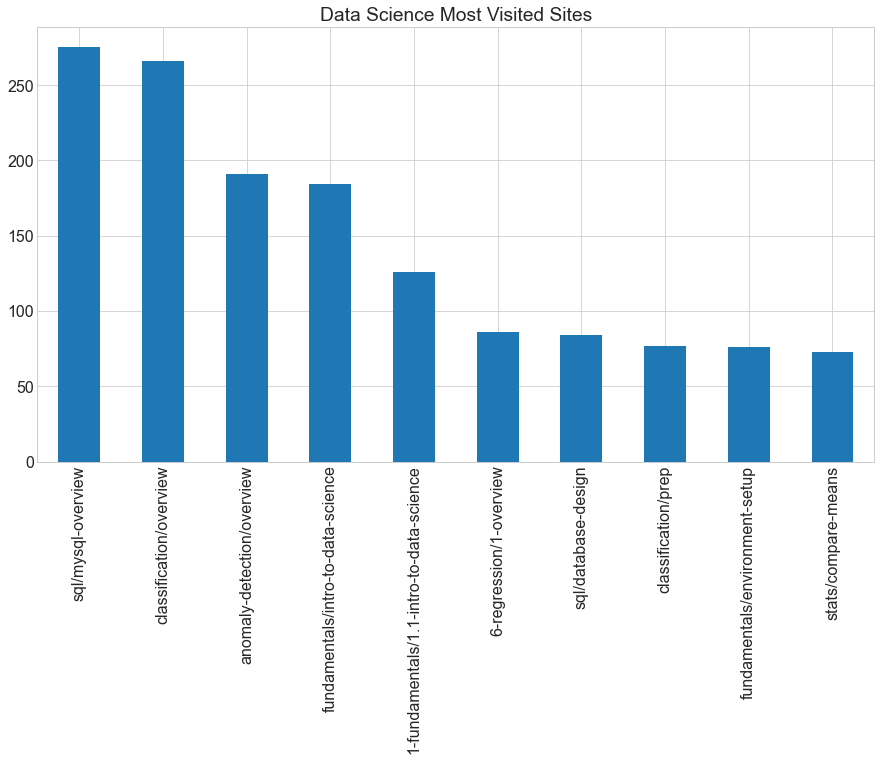

In [38]:
# Plot the top 10 most view topics by grads in Data science 
DS_grads.endpoint.value_counts().head(10).plot.bar(title = 'Data Science Most Visited By Grads', figsize = (15,8))

- 

In [51]:
# Java Full Stack Web Development students referring to the curriculum after graduation
java_full_stack_web_development = grads[(grads.index > grads['end_date']) & (grads['program_id']== 2.0)]

#Group Java Full Stack Web Development students by topic
java_full_stack_web_development.groupby(java_full_stack_web_development.endpoint).head()

,date,time,endpoint,user_id,cohort_id,source_ip,cohort_name,start_date,end_date,created_at,updated_at,program_id,date_time,program_name
date,,,,,,,,,,,,,,
2018-01-26,2018-01-26,10:59:02,index.html,21,16.0,71.137.146.71,Niagara,2016-10-26,2017-03-09,2016-10-26 02:34:05,2016-10-26 14:30:19,2.0,2018-01-26 10:59:02,Java Full Stack Web Development
2018-01-26,2018-01-26,10:59:06,java-i,21,16.0,71.137.146.71,Niagara,2016-10-26,2017-03-09,2016-10-26 02:34:05,2016-10-26 14:30:19,2.0,2018-01-26 10:59:06,Java Full Stack Web Development
2018-01-26,2018-01-26,11:36:35,javascript-i,26,18.0,97.105.19.61,Pinnacles,2017-03-27,2017-07-20,2017-03-28 00:33:12,2017-03-28 00:33:12,2.0,2018-01-26 11:36:35,Java Full Stack Web Development
2018-01-26,2018-01-26,11:36:38,javascript-i/functions,26,18.0,97.105.19.61,Pinnacles,2017-03-27,2017-07-20,2017-03-28 00:33:12,2017-03-28 00:33:12,2.0,2018-01-26 11:36:38,Java Full Stack Web Development
2018-01-26,2018-01-26,13:57:51,spring/extra-features/file-upload,40,16.0,97.105.19.61,Niagara,2016-10-26,2017-03-09,2016-10-26 02:34:05,2016-10-26 14:30:19,2.0,2018-01-26 13:57:51,Java Full Stack Web Development
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-15,2021-04-15,16:28:50,appendix/professional-development/post-intervi...,1,28.0,70.121.199.82,Staff,2014-02-04,2014-02-04,2018-12-06 17:04:19,2018-12-06 17:04:19,2.0,2021-04-15 16:28:50,Java Full Stack Web Development
2021-04-20,2021-04-20,10:02:35,storytelling/refine-present,744,28.0,24.160.137.86,Staff,2014-02-04,2014-02-04,2018-12-06 17:04:19,2018-12-06 17:04:19,2.0,2021-04-20 10:02:35,Java Full Stack Web Development
2021-04-20,2021-04-20,14:22:21,appendix/further-reading/jquery/effects,495,51.0,72.191.50.129,Deimos,2019-09-16,2020-02-27,2019-09-16 13:07:04,2019-09-16 13:07:04,2.0,2021-04-20 14:22:21,Java Full Stack Web Development


<AxesSubplot:title={'center':'Java Full Stack Web Development Most Visited By Grads'}>

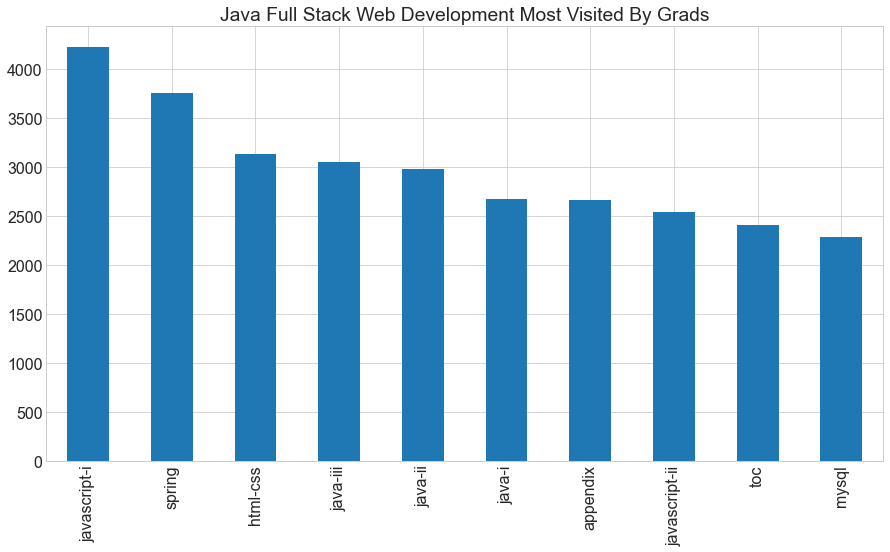

In [50]:
# Plot the top 10 most view topics by grads in Java Full Stack Web Development
java_full_stack_web_development.endpoint.value_counts().head(10).plot.bar(title = 'Java Full Stack Web Development Most Visited By Grads', figsize = (15,8))

In [53]:
# PHP Full Stack Web Development students referring to the curriculum after graduation
PHP_full_stack_web_development = grads[(grads.index > grads['end_date']) & (grads['program_id']== 1.0)]

#Group PHP Full Stack Web Development students by topic
PHP_full_stack_web_development.groupby(PHP_full_stack_web_development.endpoint).head()

,date,time,endpoint,user_id,cohort_id,source_ip,cohort_name,start_date,end_date,created_at,updated_at,program_id,date_time,program_name
date,,,,,,,,,,,,,,
2018-01-26,2018-01-26,09:56:02,java-ii,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,2016-06-14 19:52:26,2016-06-14 19:52:26,1.0,2018-01-26 09:56:02,PHP Full Stack Web Development
2018-01-26,2018-01-26,09:56:05,java-ii/object-oriented-programming,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,2016-06-14 19:52:26,2016-06-14 19:52:26,1.0,2018-01-26 09:56:05,PHP Full Stack Web Development
2018-01-26,2018-01-26,09:56:06,slides/object_oriented_programming,1,8.0,97.105.19.61,Hampton,2015-09-22,2016-02-06,2016-06-14 19:52:26,2016-06-14 19:52:26,1.0,2018-01-26 09:56:06,PHP Full Stack Web Development
2018-01-26,2018-01-26,10:14:51,javascript-i,11,1.0,97.105.19.61,Arches,2014-02-04,2014-04-22,2016-06-14 19:52:26,2016-06-14 19:52:26,1.0,2018-01-26 10:14:51,PHP Full Stack Web Development
2018-01-26,2018-01-26,10:15:02,javascript-i/functions,11,1.0,97.105.19.61,Arches,2014-02-04,2014-04-22,2016-06-14 19:52:26,2016-06-14 19:52:26,1.0,2018-01-26 10:15:02,PHP Full Stack Web Development
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-02-18,2021-02-18,05:59:41,content/jquery/essential-methods/gitbook/image...,51,13.0,70.122.42.101,Kings,2016-05-23,2016-09-15,2016-06-14 19:52:26,2016-06-14 19:52:26,1.0,2021-02-18 05:59:41,PHP Full Stack Web Development
2021-02-18,2021-02-18,05:59:45,content/jquery/essential-methods/attributes-an...,51,13.0,70.122.42.101,Kings,2016-05-23,2016-09-15,2016-06-14 19:52:26,2016-06-14 19:52:26,1.0,2021-02-18 05:59:45,PHP Full Stack Web Development
2021-02-26,2021-02-26,09:38:22,git,139,14.0,174.25.169.61,Lassen,2016-07-18,2016-11-10,2016-07-18 19:06:27,2016-07-18 19:06:27,1.0,2021-02-26 09:38:22,PHP Full Stack Web Development


<AxesSubplot:title={'center':'PHP Full Stack Web Development Most Visited By Grads'}>

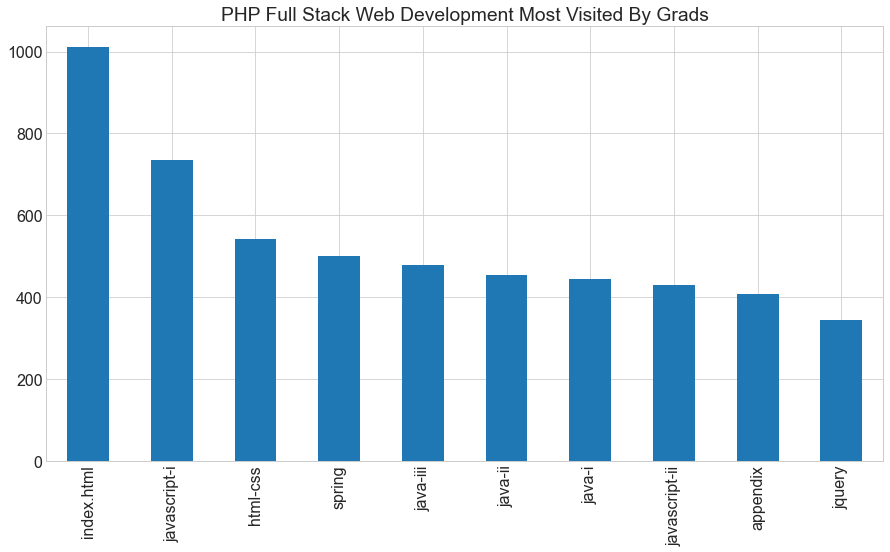

In [57]:
# Plot the top 10 most view topics by grads in PHP Full Stack Web Development
PHP_full_stack_web_development.endpoint.value_counts().head(10).plot.bar(title = 'PHP Full Stack Web Development Most Visited By Grads', figsize = (15,8))

In [55]:
# Front End Web Development students referring to the curriculum after graduation
front_end_web_development = grads[(grads.index > grads['end_date']) & (grads['program_id']== 4.0)]

# Group Front End Web Development students by topic
front_end_web_development.groupby(front_end_web_development.endpoint).head()

,date,time,endpoint,user_id,cohort_id,source_ip,cohort_name,start_date,end_date,created_at,updated_at,program_id,date_time,program_name
date,,,,,,,,,,,,,,
2018-03-22,2018-03-22,19:01:54,content/html-css,152,9.0,207.68.209.17,Apollo,2015-03-30,2015-07-29,2016-06-14 19:52:26,2016-06-14 19:52:26,4.0,2018-03-22 19:01:54,Front End Web Development
2018-03-22,2018-03-22,19:01:54,content/html-css/gitbook/images/favicon.ico,152,9.0,207.68.209.17,Apollo,2015-03-30,2015-07-29,2016-06-14 19:52:26,2016-06-14 19:52:26,4.0,2018-03-22 19:01:54,Front End Web Development
2018-03-22,2018-03-22,19:02:47,content/html-css,152,9.0,207.68.209.17,Apollo,2015-03-30,2015-07-29,2016-06-14 19:52:26,2016-06-14 19:52:26,4.0,2018-03-22 19:02:47,Front End Web Development
2018-03-22,2018-03-22,19:02:52,content/html-css/introduction.html,152,9.0,207.68.209.17,Apollo,2015-03-30,2015-07-29,2016-06-14 19:52:26,2016-06-14 19:52:26,4.0,2018-03-22 19:02:52,Front End Web Development


<AxesSubplot:title={'center':'Front End Web Development Most Visited By Grads'}>

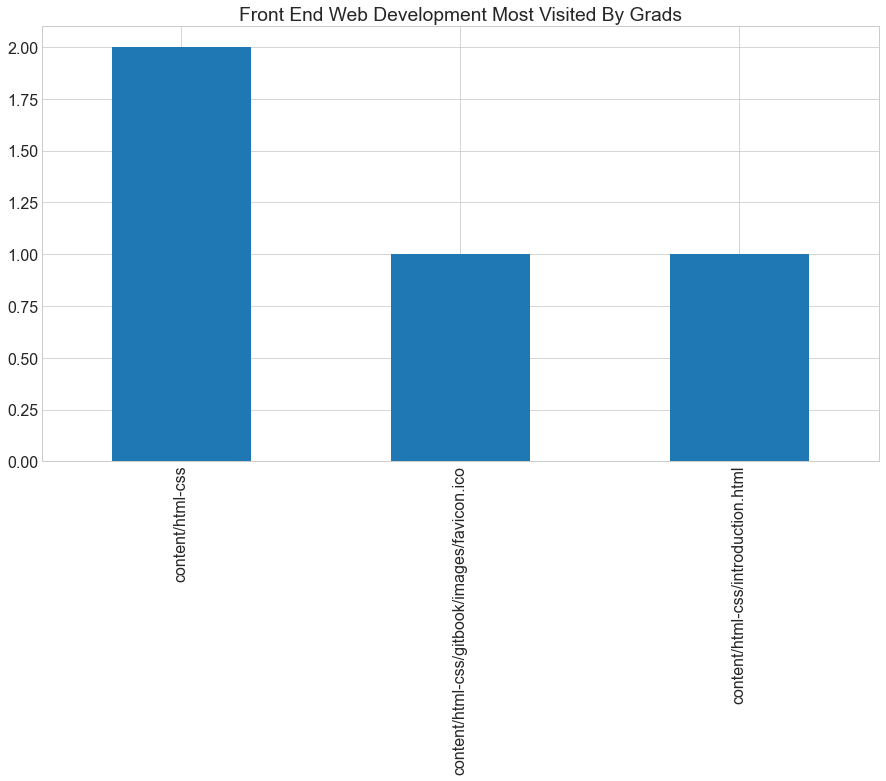

In [56]:
# Plot the view topics by grads in PHP Front End Web Development
front_end_web_development.endpoint.value_counts().head(10).plot.bar(title = 'Front End Web Development Most Visited By Grads', figsize = (15,8))

# 7.
Which lessons are leasts accessed?

In [40]:
least_accessed = df_dw[df_dw['program_name'] == 'Data Science'].endpoint.value_counts();

In [41]:
least_accessed = pd.DataFrame(least_accessed)

In [42]:
least_accessed.endpoint.unique().sum()

60120

In [43]:
least_accessed = least_accessed.sort_values('endpoint').index.value_counts().rename('endpoint_count').reset_index()

In [44]:
least_accessed.shape

(631, 2)

In [45]:
(least_accessed.endpoint_count < 5).value_counts()

True    631
Name: endpoint_count, dtype: int64

In [46]:
least_accessed.tail(50)


,index,endpoint_count
581,7-classification/2-intro-to-classification,1
582,darden-python-assessment.html,1
583,appendix/cli/4-navigating-the-filesystem,1
584,model,1
585,11-nlp/3-acquire,1
586,python/custom-sorting-functions,1
587,13-advanced-topics/3.4-intro-to-flask,1
588,database-design,1
589,search,1
590,advanced-topics/developing-data-products,1


In [47]:
# export least acessed to csv
least_accessed.to_csv('least_accessed.csv')


### Takeaway

- 631 endpoints could be classified as the least accessed.

# 8.
Anything else I should be aware of?

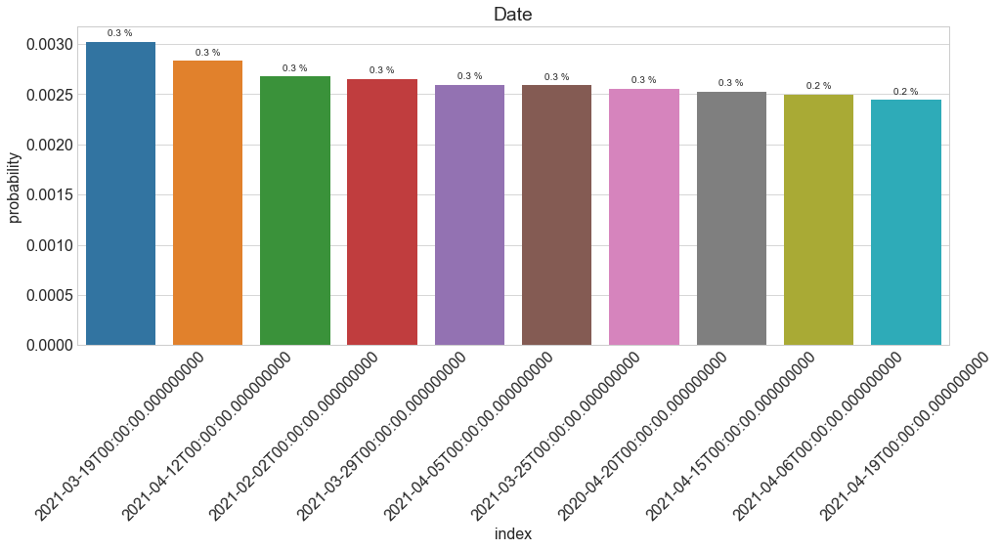

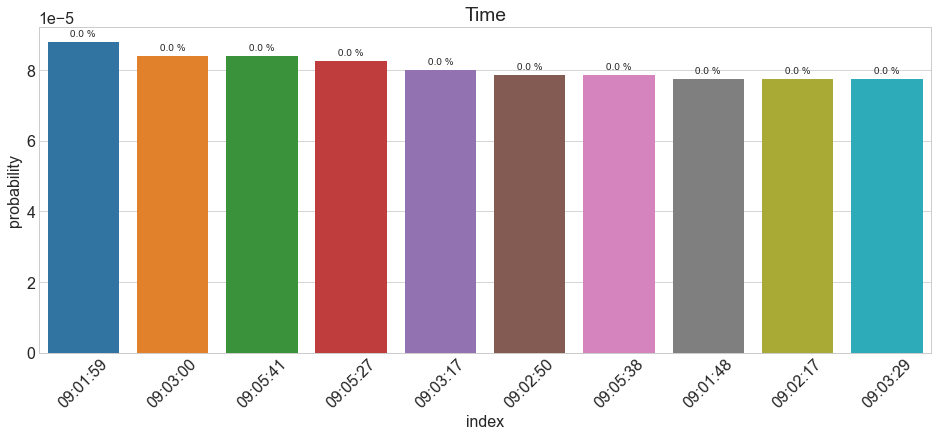

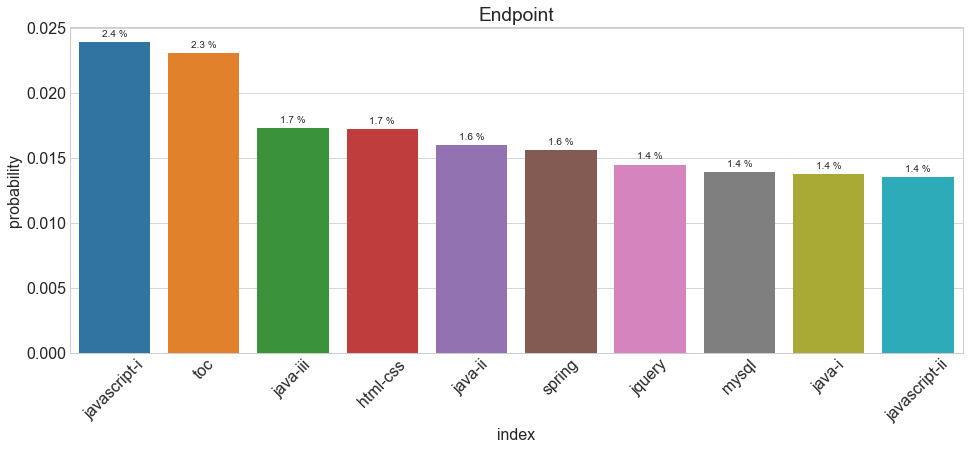

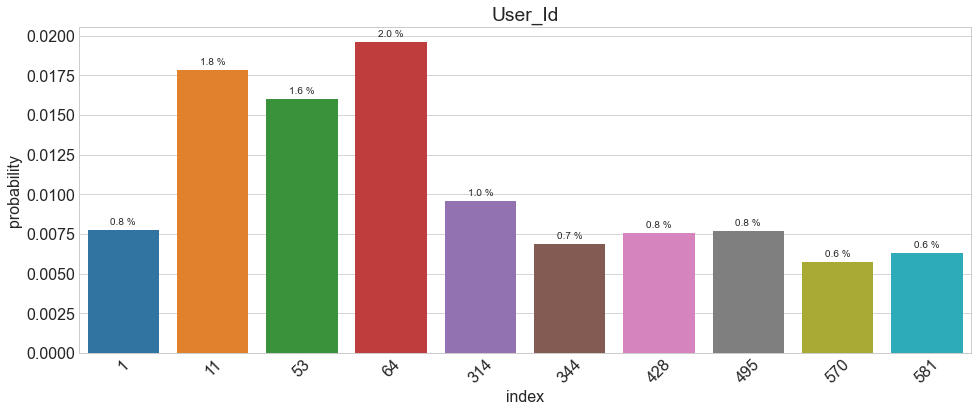

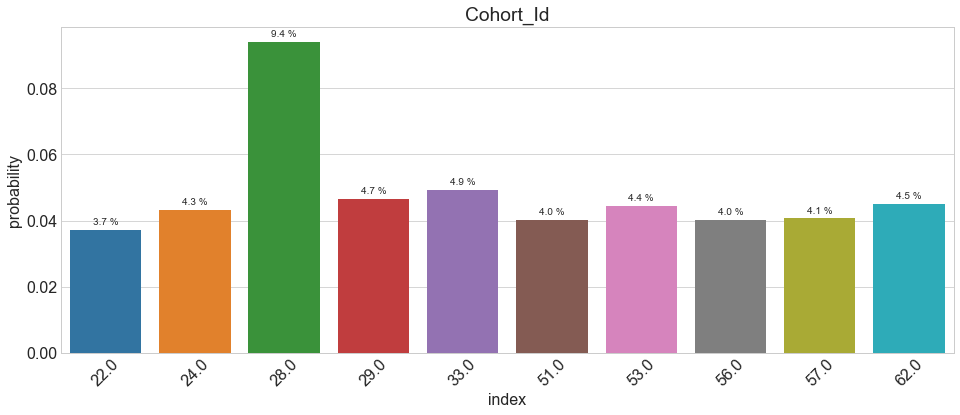

...

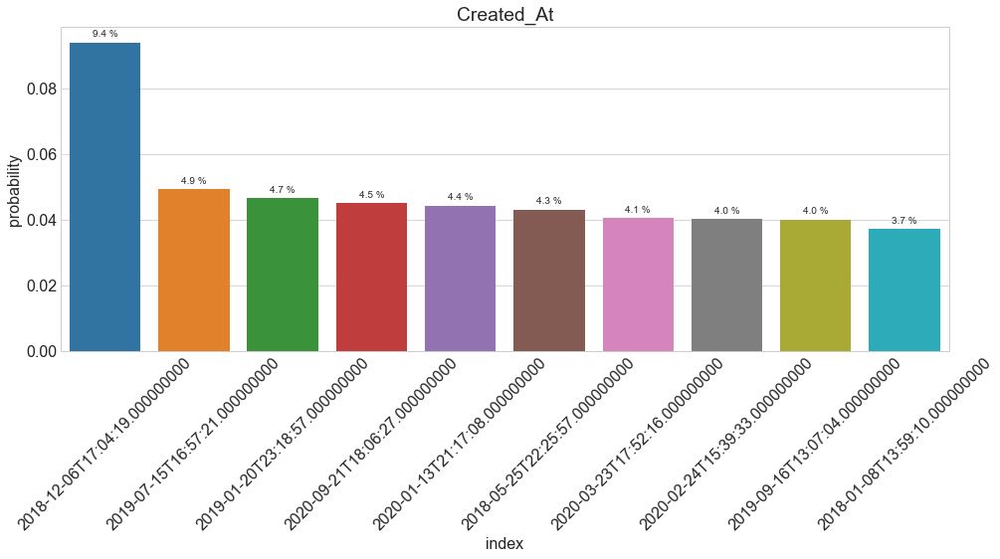

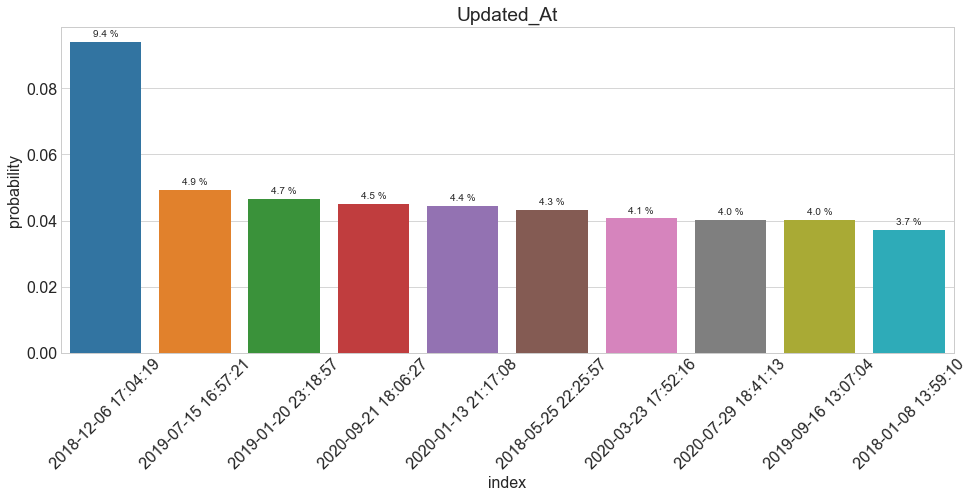

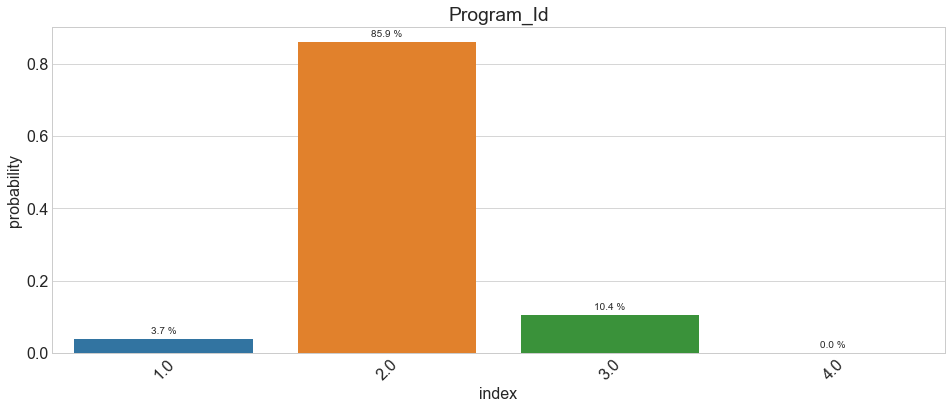

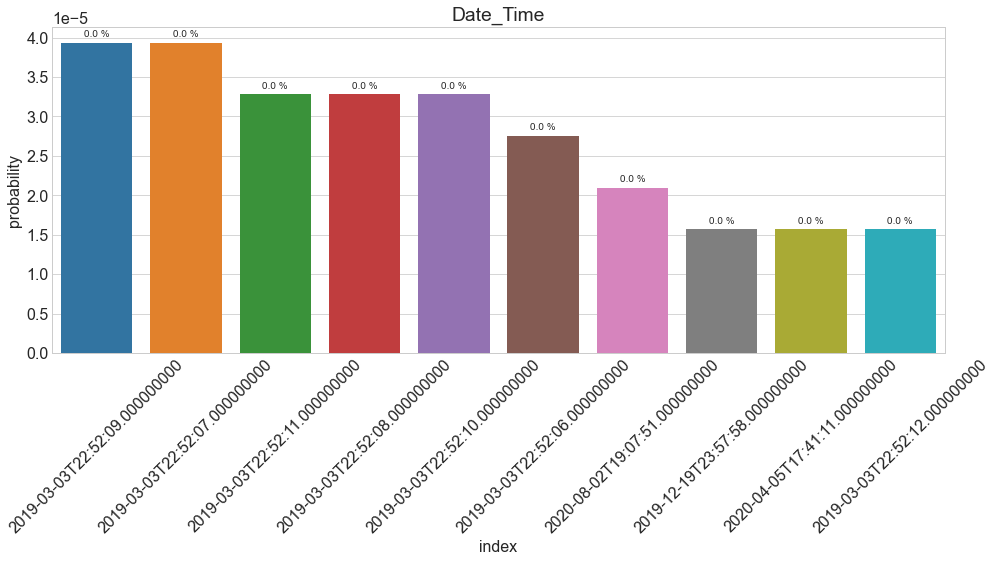

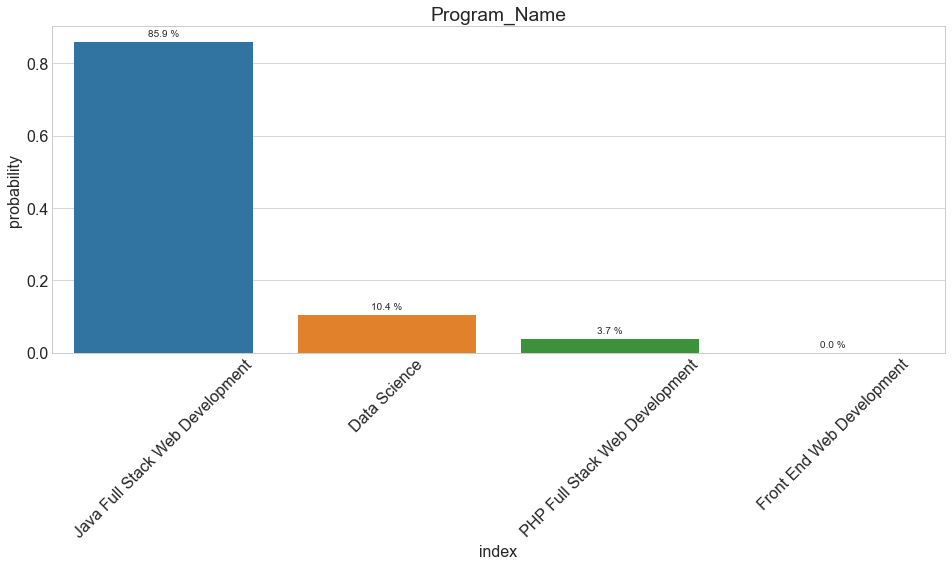

In [48]:
# create graphs based on the percentage taken by the top 10 by column  
for col in df_dw.columns:
    plt.figure(figsize=(16, 6))
    splot = sns.barplot(x='index', y=col, data=df_dw[col].value_counts(normalize=True).reset_index().sort_values(
        by=col, ascending=False).head(10))
    for p in splot.patches:
        splot.annotate(format(p.get_height() * 100, '.1f') + ' %', 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   size=10,  
                   xytext = (0, 8), 
                   textcoords = 'offset points')
    plt.xticks(rotation=45)  
    plt.title(col.title())
    plt.ylabel('probability')
    plt.show()
